<a href="https://colab.research.google.com/github/Salma11557/Biometrics/blob/main/Deepfake.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title Step 1: Load Data and packages
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import os
import dlib
import time
from skimage import feature
from IPython.display import HTML, display
from IPython.display import clear_output

#Function for progress bar.
def progress(value, max=100):
    return HTML("""<progress value='{value}' max='{max}', style='width: 100%'>
            {value}
        </progress>""".format(value=value, max=max))

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

#downloaded = drive.CreateFile({'id': '1nWbItUzADjC3OtN3ijph6S5PIMTYfT2H'})   # replace the id with id of file you want to access
downloaded = drive.CreateFile({'id': '1RSQPzZ0fDVccCgmkj_v8TLnlixgyubY3'})
downloaded.GetContentFile('dataset3_face.zip')        # replace the file name with your file
!unzip dataset3_face.zip
clear_output()
print('Done! Press the Refresh button if files are not visible.')

Done! Press the Refresh button if files are not visible.


In [ ]:
#@title Step 2: Face extraction as region of interest
face_detector = dlib.get_frontal_face_detector()
path = "/content/deepfakes/db/"
images = os.listdir(path)

print('Extracting faces...')
out = display(progress(0, len(images)*2), display_id=True)
kk=0
t = time.time()
data = []
labels = []

for i in images:
    path = path + i
    images = os.listdir(path)
    for j in images:
        img = cv2.imread(path+"/"+j)
        detected_faces = face_detector(img,1)
        for i, face_rect in enumerate(detected_faces):
            crop_img = img[face_rect.top():face_rect.bottom(),face_rect.left():face_rect.right()]
            try:
              resized = cv2.resize(crop_img, (100,100), interpolation = cv2.INTER_AREA) #resizing the image as 100*100
              data.append(resized) #Storing the resized image aas data
              if os.path.basename(os.path.normpath(path)) == "0-CelebA": #Giving the label names for all the folders that are stating with 0- as 0 and 1- as 1 
                  labels.append(0)   
              elif os.path.basename(os.path.normpath(path)) == "0-FFHQ":
                  labels.append(0)
              elif os.path.basename(os.path.normpath(path)) == "1-ATTGAN":
                  labels.append(1)
              elif os.path.basename(os.path.normpath(path)) == "1-StarGAN":
                  labels.append(1)
               
            except:
              pass
        kk=kk+1
        out.update(progress(kk, len(images)*2))
    path = "/content/deepfakes/db/"

elapsed = 'Process completed! Elapsed time: %.2f s' %(time.time() - t)
print(elapsed)

Extracting faces...


Process completed! Elapsed time: 275.26 s


In [ ]:
#Copying the contents into X and Y
X = np.array(data) 
Y = np.array(labels)

In [ ]:
#Verifying the shape of X and Y inorder to cross check whether the shape is 100*100 and 3 Dimensional
print(X.shape)
print(Y.shape)

(1177, 100, 100, 3)
(1177,)


In [ ]:
#@title Step 3: Split train e test with random_state=0 so that the data will be same for all executions
from sklearn.model_selection import train_test_split 
x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size = 0.2,random_state=0)
#train and test normalization
print(np.max(x_train))

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
min=np.min(x_train)
maxmin=np.max(x_train)-min
x_train = (x_train - min) /maxmin # min-max norm
x_test = (x_test - min) / maxmin
print(np.max(x_train))
#Verifying the shape of training samples and no. of samples in train and test dataset
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')


255
1.0
x_train shape: (941, 100, 100, 3)
941 train samples
236 test samples


In [ ]:
import keras
num_classes=2 #Since we have 2 classes 

# convert class vectors to one-hot binary class matrices
print(y_test)
y_train = keras.utils.np_utils.to_categorical(y_train, num_classes)
y_test_c = keras.utils.np_utils.to_categorical(y_test, num_classes)
print(y_test_c[0:5])  # To verify whether the class vector converted to one hot binary class 

[0 1 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1 1 0 1 1 0 1 1 1 1 0 0 1 1 0 1 1 0 1 1 0
 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 1 1 0 1 0 0 1 0 0 1 1 1 0 0 0 1 1
 0 0 1 0 1 1 0 0 1 1 0 0 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 0 0 1 1 1
 1 0 0 1 1 1 1 0 1 1 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 1 1 1 0 1 0 0
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 0 1 1 0 0 1 0 0 1 0 1 1 1
 1 0 0 1 1 1 0 0 1 0 0 0 0 1 1 1 0 0 1 1 1 0 0 0 1 1 0 1 0 1 0 1 0 1 0 0 0
 1 0 0 0 1 0 1 1 1 0 1 0 1 1]
[[1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]]


In [ ]:
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K
from keras.layers import Dense, Dropout, Flatten, Activation
from keras.models import Sequential, Model, load_model, model_from_yaml

input_shape = (100, 100, 3)

# input image dimensions
img_rows, img_cols = 100, 100
#@title Step 5: Test with different layers and models
model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(num_classes))
model.add(Activation('softmax')) 

model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='Adam',
              metrics=['accuracy'])

history=model.fit(x_train, y_train,
          batch_size=4,
          epochs=50,
          verbose=1,
          validation_data=(x_test, y_test_c))

Epoch 1/50
236/236 [==============================] - 16s 65ms/step - loss: 0.7304 - accuracy: 0.5324 - val_loss: 0.6833 - val_accuracy: 0.5932
Epoch 2/50
236/236 [==============================] - 15s 63ms/step - loss: 0.6774 - accuracy: 0.5962 - val_loss: 0.6499 - val_accuracy: 0.5847
Epoch 3/50
236/236 [==============================] - 14s 60ms/step - loss: 0.6015 - accuracy: 0.6663 - val_loss: 0.5939 - val_accuracy: 0.6822
Epoch 4/50
236/236 [==============================] - 15s 65ms/step - loss: 0.5082 - accuracy: 0.7577 - val_loss: 0.5359 - val_accuracy: 0.7161
Epoch 5/50
236/236 [==============================] - 15s 62ms/step - loss: 0.4629 - accuracy: 0.7949 - val_loss: 0.5001 - val_accuracy: 0.7669
Epoch 6/50
236/236 [==============================] - 15s 62ms/step - loss: 0.3933 - accuracy: 0.8310 - val_loss: 0.4749 - val_accuracy: 0.7797
Epoch 7/50
236/236 [==============================] - 15s 62ms/step - loss: 0.3203 - accuracy: 0.8693 - val_loss: 0.4823 - val_accuracy:

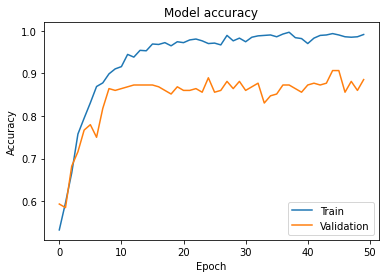

In [ ]:
#plotting inorder to understand the accuracy of the model for train and validation 
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

236


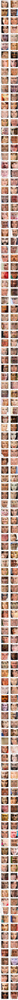

In [ ]:
#@title Step 6: Plot test samples
%matplotlib inline
xs = x_test[:]
ys = y_test_c[:]
print(len(xs))
n_cols = 2
n_rows = int(len(xs)/2)
plt.figure(figsize=(3*n_cols, 3*n_rows))
for i in range(len(xs)):
    plt.subplot(n_rows, n_cols, i+1)
    image =xs[i].reshape(100,100,3)
    im2 = image.copy()
    im2[:, :, 0] = image[:, :, 2]
    im2[:, :, 2] = image[:, :, 0]
    plt.imshow(im2)


In [ ]:
predict_x=model.predict(xs) 
prediction=np.argmax(predict_x,axis=1)
print(prediction)
from sklearn.metrics import accuracy_score
acc='Total Accuracy: %.2f %%' % (accuracy_score(y_test, prediction)*100)
print(acc)
score = model.evaluate(xs, ys, batch_size=8)
print(score)

[0 1 1 0 1 1 1 0 0 1 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 1 0 1 1 0 1 1 1
 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 1 0 1 1 1 1 0 0 1 0 0 0 1 1 0 0 0 1 1
 0 0 1 0 1 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1 0 1 1 1 1
 1 0 0 1 1 1 1 0 1 1 0 0 1 0 1 0 0 1 0 1 0 1 0 1 0 0 1 0 1 0 1 1 1 1 1 1 0
 0 1 1 1 1 0 0 0 1 0 0 1 1 1 1 1 0 0 0 0 1 1 0 0 0 1 1 0 0 1 0 0 1 0 1 1 1
 1 0 0 1 1 1 0 0 1 0 0 0 0 1 1 1 0 0 1 1 1 0 0 0 1 1 0 1 0 1 1 1 0 0 0 1 0
 1 0 0 1 1 0 1 1 1 0 1 0 0 1]
Total Accuracy: 88.56 %
30/30 [==============================] - 1s 28ms/step - loss: 0.9021 - accuracy: 0.8856
[0.9021334648132324, 0.8855932354927063]


In [ ]:
#Separate scores of real and fake

fake = predict_x[ys==1]
real = predict_x[ys==0]

#scores normalization in range [0,1]

#mx = max(np.concatenate((fake,live),axis=0))
#mn = min(np.concatenate((fake,live),axis=0))

#fake = (fake - mn)/(mx-mn)
#real = (live - mn)/(mx-mn)

#Inizialize arrays for FRR and FAR storage
FRR=np.zeros((100,1))
FAR=np.zeros((100,1))

#We set a 100 points threshold, from 0 (all users accepted) to 1 (nobody refused).
#P.S. We can do this because now the match scores are normalized.
th=np.linspace(0,1,100); 

In [ ]:
for i,t in enumerate(th):
  
  # "t" is the threshold value for each iteration

  count=len(np.argwhere(real>=t))   
  FAR[i,0]=count/len(real)*100      

  count=len(np.argwhere(fake<t))  
  FRR[i,0]=count/len(fake)*100    

In [ ]:
# EER Extimation

index = np.where(abs(FAR-FRR) == np.amin(abs(FAR-FRR))) [0] [0] #searching for index that best approximates the cross point
EER=(FAR[index]+FRR[index])/2 #EER is a mean of the value corresponding to that index
eer = 'The Equal Error Rate (EER) is %.2f %%' %(EER)
print(eer)

The Equal Error Rate (EER) is 11.44 %


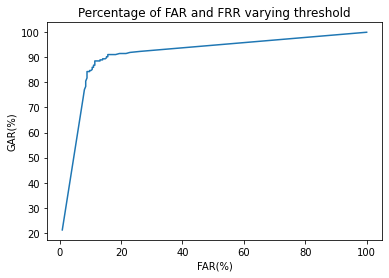

In [ ]:
#Plot FAR vs GAR aka ROC curve

fig, ax = plt.subplots()
ax.plot(FAR, 100-FRR)
ax.set(xlabel='FAR(%)', ylabel='GAR(%)',
       title='Percentage of FAR and FRR varying threshold')
plt.show()

#Coverting the samples into gray scale to check the accuracy of model with gray scale images

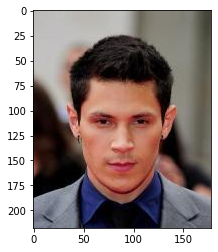

In [ ]:
bgr = cv2.imread('/content/deepfakes/db/0-CelebA/001201.jpg')
b, g, r = cv2.split(bgr)
plt.imshow(bgr)
rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
plt.imshow(rgb)


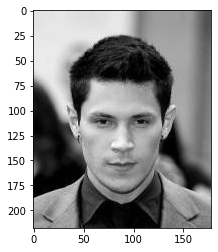

In [ ]:

gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(gray,cmap='gray')

In [ ]:
#@title Step 2: Face extraction
face_detector = dlib.get_frontal_face_detector()
path = "/content/deepfakes/db/"
images = os.listdir(path)

print('Extracting faces...')
out = display(progress(0, len(images)*2), display_id=True)
kk=0
t = time.time()
data2 = []
labels2 = []

for i in images:
    path = path + i
    images = os.listdir(path)
    for j in images:
        img = cv2.imread(path+"/"+j)
        detected_faces = face_detector(img,1)
        for i, face_rect in enumerate(detected_faces):
            crop_img = img[face_rect.top():face_rect.bottom(),face_rect.left():face_rect.right()]
            try:
              resized = cv2.resize(crop_img, (100,100), interpolation = cv2.INTER_AREA)
              gray = cv2.cvtColor(resized, cv2.COLOR_RGB2GRAY)

              data2.append(gray)
              if os.path.basename(os.path.normpath(path)) == "0-CelebA":
                  labels2.append(0)   
              elif os.path.basename(os.path.normpath(path)) == "0-FFHQ":
                  labels2.append(0)
              elif os.path.basename(os.path.normpath(path)) == "1-ATTGAN":
                  labels2.append(1)
              elif os.path.basename(os.path.normpath(path)) == "1-StarGAN":
                  labels2.append(1)
               
            except:
              pass
        kk=kk+1
        out.update(progress(kk, len(images)*2))
    path = "/content/deepfakes/db/"

elapsed = 'Process completed! Elapsed time: %.2f s' %(time.time() - t)
print(elapsed)

Extracting faces...


Process completed! Elapsed time: 272.34 s


In [ ]:
XGray = np.array(data2)
YGray = np.array(labels2)

In [ ]:
#@title Step 3: Split train e test
from sklearn.model_selection import train_test_split
xg_train,xg_test,yg_train,yg_test = train_test_split(XGray,YGray,test_size = 0.2,random_state=0)
#train and test norm
print(np.max(xg_train))

xg_train = xg_train.astype('float32')
xg_test = xg_test.astype('float32')
xg_train /= 255
xg_test /= 255
min=np.min(xg_train)
maxmin=np.max(xg_train)-min
xg_train = (xg_train - min) /maxmin # min-max norm
xg_test = (xg_test - min) / maxmin
print(np.max(xg_train))

print('xg_train shape:', xg_train.shape)
print(xg_train.shape[0], 'train samples')
print(xg_test.shape[0], 'test samples')


255
1.0
xg_train shape: (941, 100, 100)
941 train samples
236 test samples


In [ ]:
import keras
num_classes=2

# convert class vectors to one-hot binary class matrices
print(yg_test)
yg_train = keras.utils.np_utils.to_categorical(yg_train, num_classes)
yg_test_c = keras.utils.np_utils.to_categorical(yg_test, num_classes)
print(yg_test_c[0:5])

[0 1 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1 1 0 1 1 0 1 1 1 1 0 0 1 1 0 1 1 0 1 1 0
 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 1 1 0 1 0 0 1 0 0 1 1 1 0 0 0 1 1
 0 0 1 0 1 1 0 0 1 1 0 0 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 0 0 1 1 1
 1 0 0 1 1 1 1 0 1 1 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 1 1 1 0 1 0 0
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 0 1 1 0 0 1 0 0 1 0 1 1 1
 1 0 0 1 1 1 0 0 1 0 0 0 0 1 1 1 0 0 1 1 1 0 0 0 1 1 0 1 0 1 0 1 0 1 0 0 0
 1 0 0 0 1 0 1 1 1 0 1 0 1 1]
[[1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]]


In [ ]:
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K
from keras.layers import Dense, Dropout, Flatten, Activation
from keras.models import Sequential, Model, load_model, model_from_yaml

input_gray_shape = (100, 100,1)

# input image dimensions
img_rows, img_cols = 100, 100
#@title Step 5: Test with different layers and models
model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_gray_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(num_classes))
model.add(Activation('softmax')) 

model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='Adam',
              metrics=['accuracy'])

history=model.fit(xg_train, yg_train,
          batch_size=4,
          epochs=50,
          verbose=1,
          validation_data=(xg_test, yg_test_c))

Epoch 1/50
236/236 [==============================] - 15s 63ms/step - loss: 0.7123 - accuracy: 0.5260 - val_loss: 0.6931 - val_accuracy: 0.4831
Epoch 2/50
236/236 [==============================] - 13s 56ms/step - loss: 0.6932 - accuracy: 0.5622 - val_loss: 0.6606 - val_accuracy: 0.6441
Epoch 3/50
236/236 [==============================] - 13s 55ms/step - loss: 0.6223 - accuracy: 0.6472 - val_loss: 0.5932 - val_accuracy: 0.6864
Epoch 4/50
236/236 [==============================] - 13s 55ms/step - loss: 0.5287 - accuracy: 0.7375 - val_loss: 0.5006 - val_accuracy: 0.7585
Epoch 5/50
236/236 [==============================] - 13s 55ms/step - loss: 0.4248 - accuracy: 0.8108 - val_loss: 0.4615 - val_accuracy: 0.7627
Epoch 6/50
236/236 [==============================] - 14s 61ms/step - loss: 0.3507 - accuracy: 0.8512 - val_loss: 0.3857 - val_accuracy: 0.8305
Epoch 7/50
236/236 [==============================] - 13s 56ms/step - loss: 0.3209 - accuracy: 0.8629 - val_loss: 0.4144 - val_accuracy:

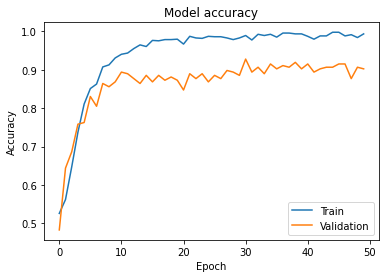

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

236


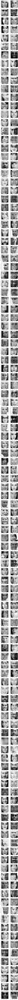

In [ ]:
#@title Step 6: Plot test samples
%matplotlib inline
xs_gray = xg_test[:]
ys_gray = yg_test_c[:]
print(len(xs_gray))
n_cols = 2
n_rows = int(len(xs_gray)/2)
plt.figure(figsize=(3*n_cols, 3*n_rows))
for i in range(len(xs_gray)):
    plt.subplot(n_rows, n_cols, i+1)
    image2 =xs_gray[i].reshape(100,100)
    im3 = image2.copy()
    plt.imshow(im3,cmap='gray')

In [ ]:
predict_xg=model.predict(xs_gray) 
prediction_gray=np.argmax(predict_xg,axis=1)
print(prediction_gray)
from sklearn.metrics import accuracy_score
acc_gray='Total Accuracy for gray images is: %.2f %%' % (accuracy_score(yg_test, prediction_gray)*100)
print(acc_gray)
score_gray = model.evaluate(xs_gray, ys_gray, batch_size=8)
print(score_gray)

[0 1 1 0 1 1 1 0 0 1 0 0 1 1 1 1 1 1 0 1 1 0 1 1 1 1 0 0 1 1 0 1 1 0 1 1 0
 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 1 0 1 1 0 1 0 0 1 0 0 1 1 1 0 0 0 0 1
 0 0 1 0 1 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 0 1 1 1 1
 1 0 0 1 1 1 1 0 1 1 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 1 1 1 1 1 1 0
 0 0 1 1 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 0 1 1 0 0 1 0 0 1 0 1 1 1
 1 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1 1 0 0 0 1 1 0 1 0 1 1 1 1 0 0 1 0
 1 0 0 0 1 0 1 1 1 0 0 0 1 1]
Total Accuracy for gray images is: 90.25 %
30/30 [==============================] - 1s 25ms/step - loss: 0.6250 - accuracy: 0.9025
[0.6250132322311401, 0.9025423526763916]


In [ ]:
#Separate scores of real and fake

fake_gray = predict_xg[ys_gray==1]
real_gray = predict_xg[ys_gray==0]

#scores normalization in range [0,1]

#mx = max(np.concatenate((fake,live),axis=0))
#mn = min(np.concatenate((fake,live),axis=0))

#fake = (fake - mn)/(mx-mn)
#real = (live - mn)/(mx-mn)

#Inizialize arrays for FRR and FAR storage
FRR=np.zeros((100,1))
FAR=np.zeros((100,1))

#We set a 100 points threshold, from 0 (all users accepted) to 1 (nobody refused).
#P.S. We can do this because now the match scores are normalized.
th_gray=np.linspace(0,1,100); 

In [ ]:
for i,tg in enumerate(th_gray):
  
  # "tg" is the threshold value for each iteration

  count=len(np.argwhere(real_gray>=tg))   
  FAR[i,0]=count/len(real_gray)*100      

  count=len(np.argwhere(fake_gray<tg))  
  FRR[i,0]=count/len(fake_gray)*100   

In [ ]:
# EER Extimation

index = np.where(abs(FAR-FRR) == np.amin(abs(FAR-FRR))) [0] [0] #searching for index that best approximates the cross point
EER=(FAR[index]+FRR[index])/2 #EER is a mean of the value corresponding to that index
eer = 'The Equal Error Rate (EER) is %.2f %%' %(EER)
print(eer)

The Equal Error Rate (EER) is 9.75 %


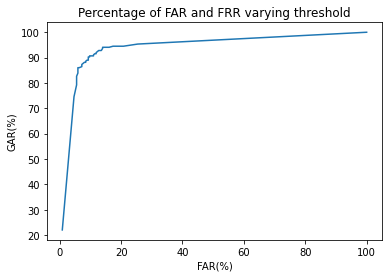

In [ ]:
#Plot FAR vs GAR aka ROC curve

fig, ax = plt.subplots()
ax.plot(FAR, 100-FRR)
ax.set(xlabel='FAR(%)', ylabel='GAR(%)',
       title='Percentage of FAR and FRR varying threshold')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
#Calculating the confusion matrix inorder to understand howmany samples are incorrectly predicted
matrix = confusion_matrix(y_test, predict_x.argmax(axis=1))
print(matrix)

[[ 96  18]
 [  9 113]]


In [ ]:
#Calculating the confusion matrix for grayscale images inorder to understand howmany samples are incorrectly predicted
matrix_gray = confusion_matrix(yg_test, predict_xg.argmax(axis=1))
print(matrix_gray)

[[103  11]
 [ 12 110]]


In [ ]:
y_test.shape

(236,)

In [ ]:
predicted_classes = np.argmax(np.round(predict_x),axis=1)


In [ ]:
predicted_classes.shape

(236,)

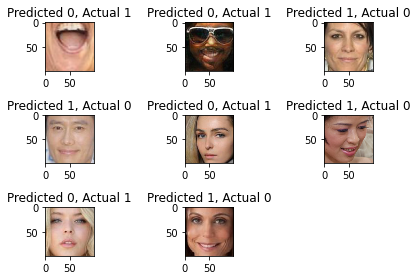

In [ ]:
incorrect = np.where(predicted_classes!=y_test)[0]
#print "Found %d incorrect labels" % len(incorrect)
for i, incorrect in enumerate(incorrect[:8]):
    plt.subplot(3,3,i+1)
    image=cv2.cvtColor(x_test[incorrect].reshape(100,100,3),cv2.COLOR_BGR2RGB)
    plt.imshow(image, cmap='gray',interpolation='none')
    plt.title("Predicted {}, Actual {}".format(predicted_classes[incorrect], y_test[incorrect]))
    plt.tight_layout()

In [ ]:
predicted_gray_classes = np.argmax(np.round(predict_xg),axis=1)


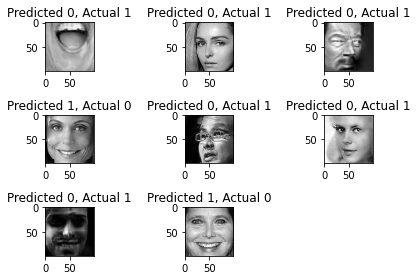

In [ ]:
incorrect_gray = np.where(predicted_gray_classes!=yg_test)[0]
#print "Found %d incorrect labels" % len(incorrect)
for i, incorrect in enumerate(incorrect_gray[:8]):
    plt.subplot(3,3,i+1)
    plt.imshow(xg_test[incorrect].reshape(100,100), cmap='gray',interpolation='none')
    plt.title("Predicted {}, Actual {}".format(predicted_gray_classes[incorrect], yg_test[incorrect]))
    plt.tight_layout()